<a href="https://colab.research.google.com/github/properallan/IM458-B/blob/master/kuramotoSivashinsky/PINN_ks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!apt install subversion
!svn checkout https://github.com/properallan/IM458-B/trunk/kuramotoSivashinsky
%cd ./kuramotoSivashinsky

# PINN - Kuramoto-Sivashinsky

In [ ]:
# Install deepxde to run in colab
!pip install deepxde 

In [ ]:
# Dependencies
import deepxde as dde
import numpy as np
import sys
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib import rc
from deepxde.backend import tf
from KS import ks_sol
import os

Using backend: tensorflow.compat.v1

2022-07-05 23:57:07.602869: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/ThirdParty-9/platforms/linux64Gcc/gperftools-svn/lib:/opt/openfoam9/platforms/linux64GccDPInt32Opt/lib/paraview-5.6:/opt/paraviewopenfoam56/lib:/opt/openfoam9/platforms/linux64GccDPInt32Opt/lib/openmpi-system:/opt/ThirdParty-9/platforms/linux64GccDPInt32/lib/openmpi-system:/usr/lib/x86_64-linux-gnu/openmpi/lib:/home/ppiper/OpenFOAM/ppiper-9/platforms/linux64GccDPInt32Opt/lib:/opt/site/9/platforms/linux64GccDPInt32Opt/lib:/opt/openfoam9/platforms/linux64GccDPInt32Opt/lib:/opt/ThirdParty-9/platforms/linux64GccDPInt32/lib:/opt/openfoam9/platforms/linux64GccDPInt32Opt/lib/dummy
2022-07-05 23:57:07.602921: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a

Instructions for updating:
non-resource variables are not supported in the long term



Scripts for reshaping datasets.

In [ ]:
def chunks(l, n):
    n = max(1, n)
    return [l[i:i+n] for i in range(0, len(l), n)]

def spaceTimeDomain(x, t):
    o = np.ones(len(x)*len(t))
    t = chunks_multiply(o, len(x), t)
    
    X = np.zeros_like(t)
    X = chunks_copy(X, len(x), x)
    X = np.stack((X, t), axis=1)
    return X

def chunks_multiply(l, n, t):
    n = max(1, n)
    for j,i in enumerate(range(0, len(l), n)): l[i:i+n]=l[i:i+n]*t[j] 
    return l

def chunks_copy(l, n, x):
    n = max(1, n)
    for i in range(0, len(l), n): l[i:i+n]=x
    return l


Script for animation.

In [ ]:
def animate(X, y_true, y_pred, t):
    rc('animation', html='jshtml')
    Nt = y_pred.shape[0]
    N = y_pred.shape[1]
    
    Xc = X

    y_truec = y_true
    y_predc = y_pred

    fig = plt.figure(figsize=(5,5))
    ax = plt.axes(xlim=(0.0,100.0), ylim=(-3,3),xlabel=(r'x'),ylabel=(r'u(x,t)'))
    line = ax.plot([], [], lw=1)[0]
    line2 = ax.plot([], [], lw=1)[0]

    def init():
        line.set_data([], [])
        line2.set_data([], [])
        line.set_label('Exact')
        line2.set_label('PINN')
        legend = plt.legend()
        plt.close()
        return line,line2,legend

    def animate(i):
        ax.set_title(r't={:.2f}'.format(t[i]))
        line.set_data(Xc[0,:], y_truec[i,:])   
        line2.set_data(Xc[0,:], y_predc[i,:])
        return line,line2
    
    anim = animation.FuncAnimation(fig, animate, init_func=init, frames=Nt, interval=100, blit=True)
    plt.close()
    anim
    return anim


The main abstract class for a Physics Informed Neural Network.

In [ ]:
class PINN(object):
    def __init__(self, path=None):
        self.path = path
        self.restorepath = None
        self.loss_weights = None
        
    def setDomain(self, x_domain, t_domain):
        self.x_domain = x_domain
        self.t_domain = t_domain
        self.geom = dde.geometry.Interval(*x_domain)
        self.timedomain = dde.geometry.TimeDomain(*t_domain)
        self.geomtime = dde.geometry.GeometryXTime(self.geom, self.timedomain)
        
    def setCollocation(self, N_domain, N_boundary, N_initial):
        self.N_domain = N_domain
        self.N_boundary = N_boundary
        self.N_initial = N_initial

    def setTopology(self, NN_layers, NN_activation, NN_init):
        self.NN_layers = NN_layers
        self.NN_activation = NN_activation
        self.NN_init = NN_init

    def setOpt(self, NN_optimizers, NN_lr, NN_epochs):
        self.NN_optimizers = NN_optimizers
        self.NN_lr = NN_lr
        self.NN_epochs = NN_epochs

    def train(self, restorepath=None): 
        self.setModel()

        l = self.NN_optimizers.__len__()-1
        for i, (opt, lr, epoch) in enumerate(zip(self.NN_optimizers, self.NN_lr, self.NN_epochs)):
            if self.loss_weights is not None:
                self.model.compile(opt, lr=lr, loss_weights=self.loss_weights)
            else:
                self.model.compile(opt, lr=lr)
            if restorepath is not None:
                self.load(restorepath)
            if i == l:
                self.losshistory, self.train_state = self.model.train(epochs=epoch, model_save_path=self.path)
            else:
                self.model.train(epochs=epoch, model_save_path=self.path)

    def setModel(self, loadpath=None):
        self.setICBC()
        self.data = dde.data.TimePDE(
            self.geomtime, 
            self.pde, 
            self.icbc,
            num_domain=self.N_domain, 
            num_boundary=self.N_boundary, 
            num_initial=self.N_initial
        )
        self.net = dde.nn.FNN(self.NN_layers, self.NN_activation, self.NN_init)

        self.model = dde.Model(self.data, self.net)

    def save(self, path):
        self.model.save(path)

    def load(self, path):
        if self.restorepath != path:
            self.restorepath = path
            self.model.restore(path)

Childer class for a Kuramoto-Sivashinsky PINN. At this class the boundary and initial conditions are set under `setICBC` method. 

- Initial Condition:

$$
u (x, 0) = \cos \left( \frac{2 \pi x}{L} \right) \left( 1 + \sin \left(
\frac{2 \pi x}{L} \right) \right)
$$

- Periodic Boundary Condition:
  
$$
u (0, t) = u (L, t)
$$

Also the PDE residual is defined in the `pde` method.

$$
R = \frac{\partial u}{\partial t} + \nu \frac{\partial^4 u}{\partial x^4} +
\frac{\partial^2 u}{\partial x^2} + u \frac{\partial u}{\partial x}
$$



In [ ]:
class ksPINN(PINN):  
    def __init__(self, path):
        PINN.__init__(self, path)

    def setICBC(self):
        L = self.x_domain[1]
        self.ic = dde.icbc.IC(
            self.geomtime,
            lambda x: tf.cos(x[:,0:1]/(L/2/np.pi))*(1+tf.sin(x[:,0:1]/(L/2/np.pi))),
            lambda _, 
            on_initial: on_initial
            )

        self.bc_r = dde.icbc.PeriodicBC(
            self.geomtime, 
            0, 
            lambda x, on_boundary: on_boundary and np.isclose(x[0], self.x_domain[1]), 
        )

        self.bc_l = dde.icbc.PeriodicBC(
            self.geomtime, 
            0, 
            lambda x, on_boundary: on_boundary and np.isclose(x[0], self.x_domain[0]), 
        )
        self.icbc = [self.ic, self.bc_r]

    def pde(self, x, u):
        ni=1.0
        du_t = dde.grad.jacobian(u, x, i=0, j=1)
        du_x = dde.grad.jacobian(u, x, i=0, j=0)
        du_xx = dde.grad.hessian(u, x, i=0, j=0)
        du_xxxx = dde.grad.hessian(du_xx, x, i=0, j=0)
        return du_t + ni*du_xxxx + du_xx + u*du_x
    
    def predict(self, Nx, Nt):
        self.x = np.linspace(self.x_domain[0], self.x_domain[-1], Nx)
        self.t = np.linspace(self.t_domain[0], self.t_domain[-1], Nt)
        self.X = spaceTimeDomain(self.x, self.t)
        self.u_pred = self.model.predict(self.X)
        self.u_pred = chunks(self.u_pred, Nx)
        self.u_pred = np.asarray(self.u_pred)[:,:,0]
        
        self.X, self.T = np.meshgrid(self.x, self.t)
        
        self.solve_exact(Nx, Nt)
        

    def solve_exact(self, Nx, Nt):
        # Numeric
        L =  self.x_domain[1]
        tend = self.t_domain[1]
        dt = tend/Nt
        
        x = np.linspace(self.x_domain[0], self.x_domain[1], Nx)
        t = np.linspace(self.t_domain[0], self.t_domain[1], Nt)
        
        u0 = np.cos(x/(L/2/np.pi))*(1+np.sin(x/(L/2/np.pi)))
        self.u_true, tt, xx = ks_sol(x, u0, tmax=tend, h=dt)

    def animate(self):
        return animate(self.X, self.u_true, self.u_pred, self.t)

    def plot(self, val, fig=None, ax=None):
        if fig is None and ax is None:
            fig, ax = plt.subplots()
        p = ax.pcolormesh(self.T,self.X, val, alpha=1)
        fig.colorbar(p)
        ax.set_ylabel(r'x')
        ax.set_xlabel(r't')

    def plotPred(self, fig=None, ax=None):
        self.plot(self.u_pred, fig, ax)
        ax = plt.gca()
        ax.set_title('PINN')

    def plotExact(self, fig=None, ax=None):
        self.plot(self.u_true, fig, ax)
        ax=plt.gca()
        ax.set_title('Exact')
        
    def plotNRSE(self, fig=None, ax=None):
        max = np.max(self.u_true)
        min = np.min(self.u_true)
        range = max - min
        val = ((self.u_pred-self.u_true)**2)**0.5/range
        self.plot(val, fig, ax)    
        ax=plt.gca()
        ax.set_title('NRSE')

    def ploti(self, i, fig=None, ax=None):
        if fig is None and ax is None:
            fig, ax = plt.subplots()
        ax.set_title(r't={:.2f}'.format(self.t[i]))
        ax.plot(self.X[0,:], self.u_true[i], label='Exact')
        ax.plot(self.X[0,:], self.u_pred[i], label='PINN')
        ax.legend()
        ax.set_ylabel(r'u(x,t)')
        ax.set_xlabel(r'x')

    def setLW(self, LW):
        self.loss_weights = LW

Setup function for the PINN, define space-time domain in `setDomain`. Number of sampling points in `setCollocation`. Neural Networks layers, activation function and initializers in `setTopology`. Setup the optimizers in `setOpt`. Finally starts the training.

In [ ]:
def setPINN(savepath, L, tend):
    PINN = ksPINN(savepath)
    #PINN.setLW([1,100,100])
    PINN.setDomain(x_domain=(0, L), t_domain=(0, tend))
    PINN.setCollocation(N_domain=4096, N_boundary=128, N_initial=128)
    PINN.setTopology(NN_layers=[2]+[64]*4+[1], NN_activation='sin', NN_init='Glorot normal')
    PINN.setOpt(NN_optimizers=['adam', 'L-BFGS'], NN_lr=[1e-3, None], NN_epochs=[5000, None])
    
    PINN.train()
    return PINN

Setup and train a PINN for the KS with specified L and tend.

In [ ]:
pinn = setPINN('./ks/ksPINN', L=32*np.pi, tend=100)

/home/ppiper/miniconda3/lib/python3.9/site-packages/skopt/sampler/sobol.py:246: UserWarning: The balance properties of Sobol' points require n to be a power of 2. 0 points have been previously generated, then: n=0+4098=4098. 
  warnings.warn("The balance properties of Sobol' points require "
/home/ppiper/miniconda3/lib/python3.9/site-packages/skopt/sampler/sobol.py:246: UserWarning: The balance properties of Sobol' points require n to be a power of 2. 0 points have been previously generated, then: n=0+130=130. 
  warnings.warn("The balance properties of Sobol' points require "
/home/ppiper/miniconda3/lib/python3.9/site-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:103: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(
/home/ppiper/miniconda3/lib/python3.9/site-packages/keras/legacy_tf_layers/core.py:261: UserWarning: `layer.apply` is deprecated and will be removed in a future ver

Compiling model...
Building feed-forward neural network...
'build' took 0.548567 s



2022-07-05 23:57:21.356352: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-07-05 23:57:21.371247: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/ThirdParty-9/platforms/linux64Gcc/gperftools-svn/lib:/opt/openfoam9/platforms/linux64GccDPInt32Opt/lib/paraview-5.6:/opt/paraviewopenfoam56/lib:/opt/openfoam9/platforms/linux64GccDPInt32Opt/lib/openmpi-system:/opt/ThirdParty-9/platforms/linux64GccDPInt32/lib/openmpi-system:/usr/lib/x86_64-linux-gnu/openmpi/lib:/home/ppiper/OpenFOAM/ppiper-9/platforms/linux64GccDPInt32Opt/lib:/opt/site/9/platforms/linux64

'compile' took 20.510018 s

Initializing variables...


2022-07-05 23:57:41.933423: W tensorflow/compiler/jit/mark_for_compilation_pass.cc:1658] (One-time warning): Not using XLA:CPU for cluster.

If you want XLA:CPU, do one of the following:

 - set the TF_XLA_FLAGS to include "--tf_xla_cpu_global_jit", or
 - set cpu_global_jit to true on this session's OptimizerOptions, or
 - use experimental_jit_scope, or
 - use tf.function(jit_compile=True).

To confirm that XLA is active, pass --vmodule=xla_compilation_cache=1 (as a
proper command-line flag, not via TF_XLA_FLAGS).


Training model...

Step      Train loss                        Test loss                         Test metric
0         [2.31e-02, 8.36e-01, 7.28e-01]    [2.31e-02, 8.36e-01, 7.28e-01]    []  
1000      [5.70e-04, 9.67e-06, 2.47e-06]    [5.70e-04, 9.67e-06, 2.47e-06]    []  
2000      [3.65e-04, 6.66e-05, 3.03e-04]    [3.65e-04, 6.66e-05, 3.03e-04]    []  
3000      [2.98e-04, 1.40e-06, 2.04e-06]    [2.98e-04, 1.40e-06, 2.04e-06]    []  
4000      [2.69e-04, 1.19e-06, 1.41e-06]    [2.69e-04, 1.19e-06, 1.41e-06]    []  
5000      [2.52e-04, 6.46e-07, 7.90e-07]    [2.52e-04, 6.46e-07, 7.90e-07]    []  

Best model at step 5000:
  train loss: 2.53e-04
  test loss: 2.53e-04
  test metric: []

INFO:tensorflow:./ks/ksPINN-5000.ckpt is not in all_model_checkpoint_paths. Manually adding it.
Epoch 5000: saving model to ./ks/ksPINN-5000.ckpt ...

'train' took 3055.481996 s

Compiling model...
'compile' took 5.450737 s

Training model...

Step      Train loss                        Test loss      

Evaluate a prediction using the trained PINN.

In [ ]:
pinn.predict(Nx=512, Nt=500)

Plotting time evolution.

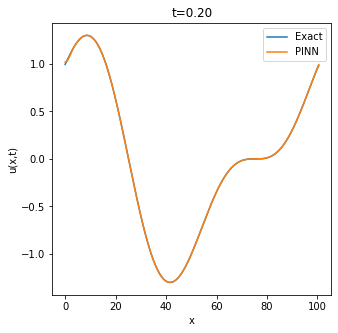

In [ ]:
i=1
fig = plt.figure(figsize=(5,5))
ax = plt.gca()
pinn.ploti(i, fig, ax)
plt.savefig('it_{}_ksPINN.png'.format(i))

Plot PINN prediction over all space-time domain.

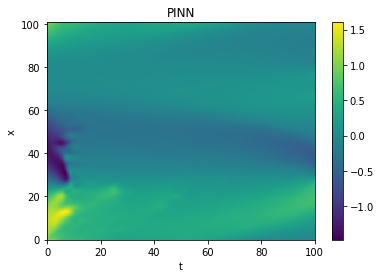

In [ ]:
pinn.plotPred()
plt.savefig('ksPINN.png')

Plot ground-truth numerical solution.

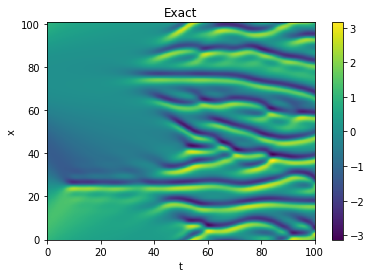

In [ ]:
pinn.plotExact()
plt.savefig('ksExact.png')

Plot normalized root squared error.

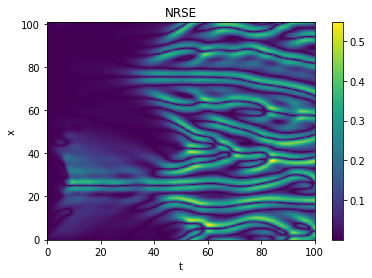

In [ ]:
pinn.plotNRSE()
plt.savefig('ksPINNnrse.png')


Make and animation over time.

In [ ]:
anim = pinn.animate()
anim

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
